# I - Movement Data Processing 

## Dataset description
This dataset contains positions of equipments over time (during a 2 week period). Every position has 2 coordinates "x" and "y", the datetime at which it was registered ("date") and a "kind" (which meaning won't be revealed but impacts the processing method). It relates to the equipment "ID_equipment" and is registered by the equipment "ID_origin".

## Important note
This notebook will contain various preprocessing steps of a private project. Any information on the context of the data will voluntarily stay hidden. This is why original positions have been modified and centered around 0, their unit won't be revealed, dates start at 2024-01-01 and the kind, ID_origin and ID_equipment have been given random meaningless identifiers.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime,timedelta
from os.path import join
import gc
pd.set_option("display.max_colwidth",None)
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)
pd.options.display.precision = 5

plt.rcParams.update(plt.rcParamsDefault)
plt.style.use('seaborn-bright')

from warnings import filterwarnings
filterwarnings("ignore")

<ipython-input-1-7e497e767d1b>:14: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-bright')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import os
os.chdir('/content/drive/My Drive/Colab Notebooks/Movement')
!ls

Mounted at /content/drive
 a.csv
 anonymisation.ipynb
 bc.csv
 comprehension_bft_g_h_p.ipynb
 d.csv
 filtrage_final_BFT.ipynb
 filtrage_intermediaire_BFT.ipynb
 map_old_to_new.csv
 methode_detection_trajectoires_exploitables-Copy1.ipynb
 movement_data.csv
 movement_tools.py
 preprocessing.ipynb
 test_methode_detection_doublons_BFTGH.ipynb
 test_methode_detection_vibration_dbscan_séparé.ipynb
'traitement_4_et_5_derniers_problemes(essais).ipynb'
'traitement_4_et_5_derniers_problemes(execution)[ajout_smiss,filtrage_par_superficie,temps].ipynb'
 traitement_6__explication_decomposee.ipynb
'traitement_6_preparation_algos[combinaison,reduction,extraction_infos].ipynb'
 traitement_pre_algo.py
 Utility
 visualizations.py


In [ ]:
!pip install colorama

In [ ]:
%load_ext autoreload
%autoreload 1
%aimport Utility.DATAINFO
%aimport Utility.plots
%aimport Utility.tools
from Utility.DATAINFO import *
import Utility.plots as pl
from Utility.tools import *
from Utility.DateTime import *

# 1. Basic dataset exploration

This part will be voluntarily small and undetailed because the source of the data has to remain unknown, and the meaning of each column will not be detailed.

In [ ]:
data = pd.read_csv("movement_data.csv",parse_dates=['date'], dtype={
    "ID_origin": "int32", "ID_equipment": "int32", "x": float, "y": float,
    "velocity": float, "kind": str,
})
data.sort_values('date').reset_index(drop=True)
data.head()

,date,kind,ID_origin,ID_equipment,x,y
0,2024-01-01 12:35:20.125,B1,0,0,0.48785,-7.23060
1,2024-01-01 12:35:20.813,A,0,1,0.48792,-7.31584
2,2024-01-01 12:35:21.107,B1,0,2,0.43754,-7.26871
3,2024-01-01 12:35:21.813,A,0,1,0.48792,-7.31399
4,2024-01-01 12:35:22.421,B1,0,3,0.43754,-7.26871


In [ ]:
data.shape

(3847531, 6)

In [ ]:
data["hour"] = data.date.dt.hour
data["day"] = data.date.dt.date
coords = ["x","y"]
data[['x','y']].describe()

,x,y
count,3.84753e+06,3.84753e+06
mean,4.20595e-12,-2.54055e-13
std,1.88491e+00,3.87379e+00
min,-4.83176e+00,-9.47905e+00
25%,-1.83320e+00,-1.93347e+00
50%,3.62088e-01,-2.25522e-01
75%,1.47449e+00,2.76940e+00
max,4.76366e+00,1.44533e+01


In [ ]:
data['kind'].value_counts() / data.shape[0]

,count
kind,
A,4.30571e-01
B2,3.02971e-01
B1,1.84555e-01
C,7.74273e-02
D1,4.47066e-03
D2,4.67832e-06


In [ ]:
data.ID_origin.unique(), data.ID_equipment.unique()

(array([0, 1, 2, 3, 4, 5, 6], dtype=int32),
 array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102],
       dtype=int32))

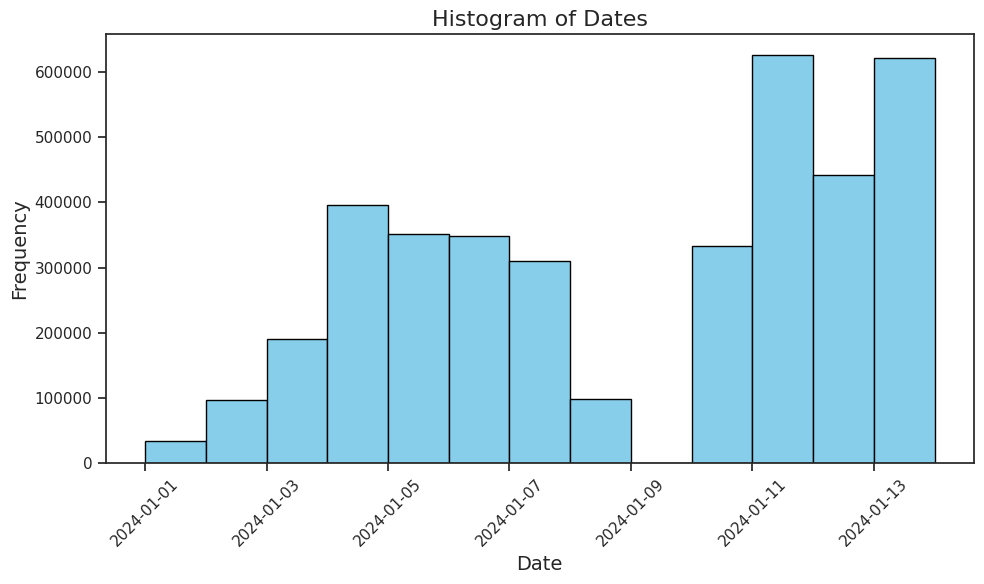

In [ ]:
plt.figure(figsize=(10, 6))
date = data['date'].dt.date
plt.hist(date, bins=len(date.unique()), color='skyblue', edgecolor='black')
plt.title('Histogram of Dates', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Filtering of useless points

## Deletion of all complete duplicates

In [ ]:
duplicates = data[data.duplicated(subset=['date', 'ID_equipment', 'x', 'y'], keep=False)].sort_values('date')
print(f"Number of duplicate rows found: {len(duplicates)}")
removed_duplicates = duplicates.copy()
data = data.drop_duplicates(subset=['date', 'ID_equipment', 'x', 'y'], keep='first')

print(f"Number of rows after duplicate removal: {len(data)}")

removed_duplicates.head()

Number of duplicate rows found: 3644
Number of rows after duplicate removal: 3845709


,date,kind,ID_origin,ID_equipment,x,y,hour,day
46893,2024-01-02 09:11:48.329,B1,0,5,-0.60626,-1.99063,9,2024-01-02
46894,2024-01-02 09:11:48.329,C,1,5,-0.60626,-1.99063,9,2024-01-02
47059,2024-01-02 09:12:29.326,C,0,12,0.48785,-7.32587,9,2024-01-02
47060,2024-01-02 09:12:29.326,C,1,12,0.48785,-7.32587,9,2024-01-02
58983,2024-01-02 10:11:03.104,B1,1,32,-0.16610,-0.39006,10,2024-01-02


In [ ]:
# find rows that have the same exact date and ID_equipment
duplicates = data[data.duplicated(subset=['date','ID_equipment'],keep=False)].sort_values('date')
print_nrows(duplicates)
duplicates.head()

Number of lines :  88


,date,kind,ID_origin,ID_equipment,x,y,hour,day
235194,2024-01-03 18:57:06.005,C,0,4,1.15437,-5.38232,18,2024-01-03
235195,2024-01-03 18:57:06.005,B2,0,4,1.11664,-5.42043,18,2024-01-03
608774,2024-01-04 17:10:10.568,B2,0,10,-0.55595,1.17240,17,2024-01-04
608775,2024-01-04 17:10:10.568,C,0,10,-0.59368,1.17240,17,2024-01-04
740165,2024-01-05 01:03:37.748,B2,0,10,-0.43019,1.36294,1,2024-01-05


### Deletion of obvious redundant type A points

This first step removes type A GPS points with identical coordinates to both preceding and following points. The data is grouped by ID_equipment to focus on each equipment separately, and a mask is created to identify these duplicates before filtering them out from the dataset.

In [ ]:
# Group by 'ID_equipment' and shift both coordinates
temp = data.groupby("ID_equipment")[['x', 'y']]

# Get the next and previous points for comparison
next_coords = temp.shift(-1)
prev_coords = temp.shift(1)

# Condition for detecting redundant points of type "A" where current, previous, and next are identical
redundant_mask = (
    (data['kind'] == "A") &
    (data['x'] == next_coords['x']) & (data['x'] == prev_coords['x']) &
    (data['y'] == next_coords['y']) & (data['y'] == prev_coords['y'])
)

# Suppress redundant points
print_nrows(data)
data = data[~redundant_mask]
print_nrows(data)

Number of lines :  3845709
Number of lines :  2835545


In [ ]:
del duplicates, removed_duplicates, next_coords, prev_coords, redundant_mask

## Deletion of GPS vibration points

In this stage, I identify and filter out GPS vibration points from the trajectory data. Vibration points typically represent instances where equipment is stationary, resulting in closely clustered GPS readings because of noise and minor fluctuations. To achieve this, I decided to use the DBSCAN algorithm to detect clusters of densely packed points in both spatial and temporal dimensions.

The process involves the following key steps:
- Data Preparation: The dataset is grouped by date and equipment ID to handle each trajectory independently. The timestamp is scaled for effective clustering.

- Parameter Optimization: We explore a range of hyperparameters (epsilon and minimum samples) to optimize the clustering performance. This is done by evaluating how likely the clusters formed are to be representing pauses in movement, focusing on their density and compactness.

- Clustering: Using the best parameters identified, we apply the DBSCAN algorithm to classify points as either part of a cluster (vibration points) or noise (movement). The clusters that exhibit a low maximum distance between their outermost points are indicative of GPS vibrations.

Filtering Clusters: For each identified cluster, we retain only the first and last points to summarize the moments of vibration, effectively reducing the dataset size while preserving all useful information.

### Preparation

In [ ]:
#Add column representing total seconds since start
data["Timestamp"] = data["date"].apply(lambda x: x.timestamp())
reference_timestamp = data.date.min().timestamp()
data.Timestamp = data.Timestamp - reference_timestamp

In [ ]:
data['vibration'] = False
data["label"] = -2

ts column: unit of time which allows the algo to take account of time on the scale of longitude and latitude (cf. data receipts)

Since the frequency, and therefore the density, of the points varies depending on the type, we split the dataset into subsets.

In [ ]:
from sklearn.cluster import DBSCAN
#Separation of dataset into groups according to probe type (local, sent, received)
data_kind_a = data[data.kind == "A"]
data_kind_bc = data[data.kind.isin(["B1","B2","C"])]
data_kind_d = data[data.kind.isin(["D1","D2"])]

In [ ]:
del data

In [ ]:
data_kind_a.shape, data_kind_bc.shape, data_kind_d.shape

((646468, 11), (2171862, 11), (17215, 11))

## Identification of vibrations

In [ ]:
import time
def calculate_approx_max_distance(cluster):
    # Calculate the distance between the outermost points in a cluster.
    # Low distance indicates tight clustering, often representing GPS vibration points
    # --> spread around the actual position, as vehicle is not moving
    # High distance suggests a long trajectory from one point to another
    xmin, ymin = cluster["x"].min(), cluster["y"].min()
    xmax, ymax = cluster["x"].max(), cluster["y"].max()
    max_distance = np.sqrt((xmax - xmin) ** 2 + (ymax - ymin) ** 2)
    return max_distance

def smooth_exponential_penalty(max_distance, turning_point=0.005, growth_rate=50):
    inside_exp = growth_rate * (max_distance - turning_point)
    # To avoid overflow :
    if inside_exp > 10: return np.exp(10)
    # Exponential penalty smoothly increasing after the turning point
    return np.exp(inside_exp)

def cluster_scoring(n_points, cluster,debug, threshold=0.004):
    # Scoring function based on how elongated the cluster is compared to its number of points
    # Ratio of the number of points to a penalized distance between the outermost cluster points (O(n))
    # High score indicates a dense, compact cluster (likely representing a pause in movement)
    # Low score indicates an elongated or sparse cluster (likely representing movement)
    max_distance = calculate_approx_max_distance(cluster)
    score = n_points / smooth_exponential_penalty(max_distance)
    if debug: print(f"Cluster with {n_points} points and max distance {max_distance} has score {score}")
    return score

def print_model_score(prefix, score, is_not_moving_sum, params, limdata):
    print(f"{prefix} score: {score} with params {params}, {is_not_moving_sum} vibrations detected with {limdata['label'].nunique()} clusters out of {limdata.shape[0]} points")

def find_best_dbscan_params(limdata, eps_values, min_samples_values, default_score=0.4, debug=False, max_points_in_cluster=20000):
    number_of_points_per_hour = limdata.shape[0] / ( (limdata.Timestamp.max() - limdata.Timestamp.min()) / 3600)

    # Initialization variables for loop
    best_score = -np.inf
    best_params = None
    best_clusters = None
    too_high_min_samples = np.inf
    max_points_in_cluster_reached = False
    i = 0

    # Test DBSCAN with each combination of hyperparameters to find which is best
    for eps in eps_values:
        for min_samples in min_samples_values:
            # Measures to prevent RAM overload when a cluster with a high number of points has been found once
            if (max_points_in_cluster_reached):
              if (i % 2) == 0:
                i+= 1
                continue
              gc.collect()
              time.sleep(2)

            # Clustering to find GPS vibration points
            dbscan_model = DBSCAN(eps=eps, min_samples=min_samples, n_jobs=-1)
            limdata['label'] = dbscan_model.fit_predict(limdata[['x', 'y', 'ts']])
            is_not_moving = limdata['label'] != -1
            clusters = limdata[is_not_moving].groupby('label')


            # Calculating the score for each cluster
            total_score = 0
            cluster_scores = []
            for label, cluster in clusters:
                # Check if the number of points isn't too high because it uses too much ram with DBSCAN
                n_points = len(cluster)
                if (not max_points_in_cluster_reached) and (n_points > max_points_in_cluster):
                  if debug: print("Maximum viable number of points inside a single cluster has been exceeded.")
                  max_points_in_cluster_reached = True
                cluster_score = cluster_scoring(n_points, cluster,debug)
                cluster_scores.append(cluster_score)

            #  Score aggregation (weighted average by number of clusters)
            if len(cluster_scores) > 0:
                avg_cluster_score = np.mean(cluster_scores)
                n_clusters = len(cluster_scores)

                # Final score adjusted to favor as many good clusters as possible
                # While keeping the average cluster score important to avoid allowing many clusters with low score
                total_score = avg_cluster_score * (1 + 0.25 * n_clusters )
            else:
                total_score = default_score

            # Update best parameters if score is better
            if total_score > best_score:
                best_score = total_score
                best_params = (eps, min_samples)
                best_is_not_moving_sum = is_not_moving.sum()
            if debug: print_model_score("Current", total_score, is_not_moving.sum(), (eps, min_samples), limdata)
            i+=1
    print_model_score("Best", best_score, best_is_not_moving_sum, best_params, limdata)
    print(f"Number of points per hour: {number_of_points_per_hour} (Best score / points per hour: {best_score / number_of_points_per_hour})")

    return best_params, best_clusters

# Main function to detect GPS vibrations
def detect_vibrations(data, eps_values, min_samples_values, low_min_samples=15, debug=False, max_i=20):

    gb = data.groupby(['day', 'ID_equipment'])
    # Group by date and id_equipment
    i = 0
    current_date = None
    for (date, id_equipment), temp in gb:
        if (current_date is None)  or (current_date != date):
            print(f"Processing date {date}")
        print(f"Processing equipment {id_equipment}")
        if temp.shape[0] <= low_min_samples:
            if debug: print(f"Skipping equipment {id_equipment} on date {date} with {temp.shape[0]} samples")
            continue

        if debug: #if debug take only first 10 equipment
            if i >= max_i:
                break
            i+=1

        # Search for the best hyperparameters for each day/equipment subset
        best_params, best_clusters = find_best_dbscan_params(temp, eps_values, min_samples_values, debug=debug)

        # Re-train DBSCAN with the best parameters
        if best_params is not None:
            eps, min_samples = best_params
            dbscan_model = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan_model.fit_predict(temp[['x', 'y', 'ts']])

            #temp = temp.assign(label=dbscan_model.fit_predict(temp[['x', 'y', 'ts']]))
            #temp['vibration'] = temp['label'] != -1
            #data.loc[temp.index, ['vibration', 'label']] = temp[['vibration', 'label']]
            data.loc[temp.index, ['label', 'vibration']] = np.column_stack((labels, labels != -1))
        del temp
        current_date = date
    return data

### Types B and C

In [ ]:
# Parameter search space for DBSCAN (can be adjusted)
eps_values = [0.02,0.025, 0.03, 0.035, 0.04, 0.045]
min_samples_values = [20, 25, 30, 35, 40]
data_kind_bc['ts'] = data_kind_bc['Timestamp'] / 10**5 * 3

In [ ]:
# Detection of vibrations for types B and C
data_kind_bc['vibration'] = False
data_kind_bc = detect_vibrations(data_kind_bc, eps_values, min_samples_values, debug=False)
data_kind_bc['vibration'].value_counts()

Processing equipment 0
Best score: 277.7494236619577 with params (0.02, 25), 618 vibrations detected with 2 clusters out of 641 points
Number of points per hour: 354.81183179180994 (Best score / points per hour: 0.7828076709260655)
Processing equipment 2
Best score: 261.62017865012734 with params (0.02, 20), 163 vibrations detected with 1 clusters out of 163 points
Number of points per hour: 207.82539833720793 (Best score / points per hour: 1.2588460349087578)
Processing equipment 3
Best score: 388.54069841926423 with params (0.02, 20), 1159 vibrations detected with 2 clusters out of 1159 points
Number of points per hour: 160.94897403734404 (Best score / points per hour: 2.4140613554275494)
Processing equipment 4
Best score: 440.1410919474173 with params (0.025, 20), 711 vibrations detected with 1 clusters out of 711 points
Number of points per hour: 252.98167207056434 (Best score / points per hour: 1.7398141467918216)
Processing equipment 5
Best score: 562.7707736760494 with params (0

,count
vibration,
1,1875815
0,296047


In [ ]:
data_kind_bc['vibration'] = data_kind_bc['vibration'].astype(bool)

In [ ]:
print_ratio(data_kind_bc,data_kind_bc.vibration,'of GPS vibration points')

86.37% of of GPS vibration points (1875815 out of 2171862)


**Let's look at the results for a few trajectories**.

We will plot the points identified as GPS vibration points (belonging to a cluster, representing a "pause" when the vehicle doesn't actually move) in red with a small size, and plot other points (outliers, which are therefore supposed to be points recorded when the vehicle moves) in green with a bigger size. That way, we can check if the algorithm is effective at identifying redundant points without removing any useful point, recorded during movement.

In [ ]:
def plot_vib_on(data,id,month,day,di, detect=False):
    temp = data[( data.ID_equipment == id) & (on_date(data,month,day))]
    if detect: temp = detect_vibrations(temp, eps_values, min_samples_values, debug=False, max_i=1)
    #print(temp.shape[0])
    pl.plot_vib(temp, id,di)
di = DATAINFO(data_kind_bc,0,0,reference_timestamp,id_col='ID_equipment',anonyme=True, year=2024)

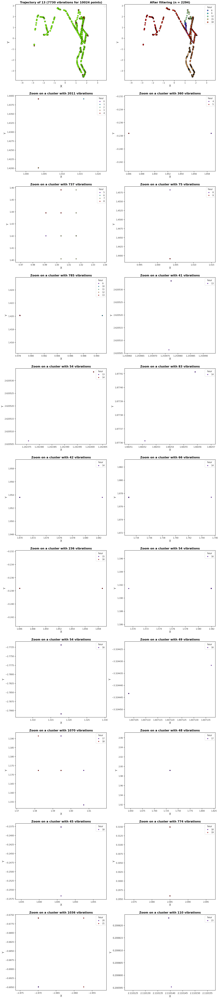

In [ ]:
plot_vib_on(data_kind_bc,13,1,5,di,detect=False)

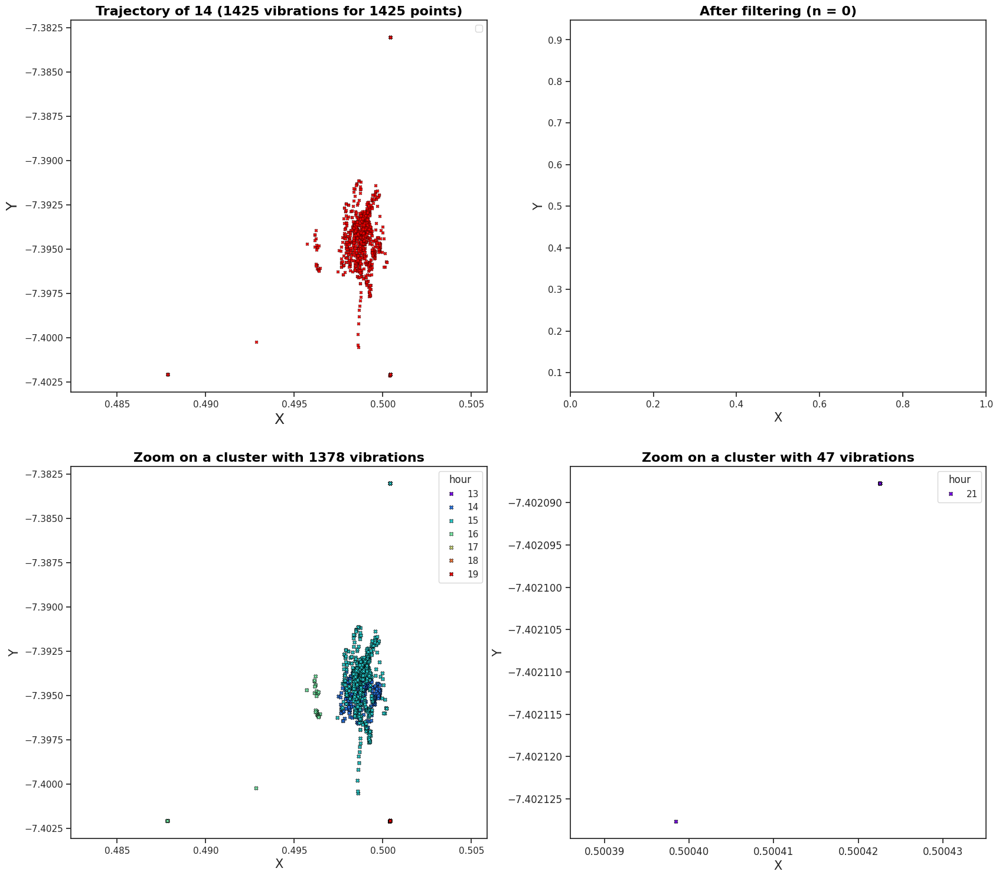

In [ ]:
plot_vib_on(data_kind_bc,14,1,10,di,detect=False)

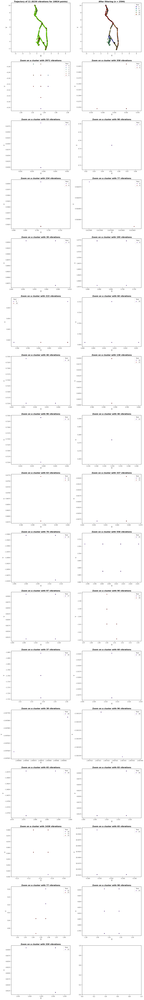

In [ ]:
plot_vib_on(data_kind_bc,11,1,7,di,detect=False)

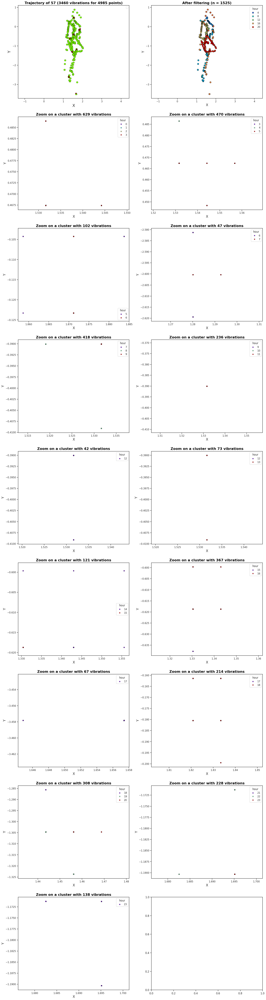

In [ ]:
plot_vib_on(data_kind_bc,57,1,5,di,detect=False)

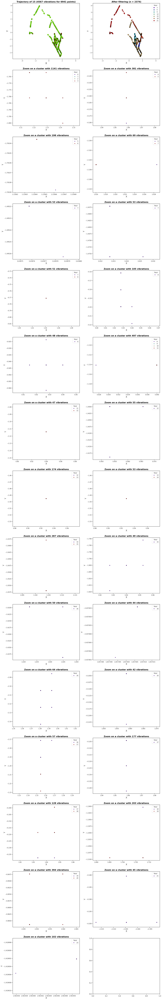

In [ ]:
plot_vib_on(data_kind_bc,15,1,5,di,detect=False)

In [ ]:
del data_kind_bc, data_kind_d, data

NameError: name 'data_kind_bc' is not defined

**Type A**

In [ ]:
# Parameter search space for DBSCAN (can be adjusted)
eps_values = [0.0005, 0.001, 0.003, 0.005, 0.01, 0.015, 0.02]
min_samples_values = [30, 40, 50, 60, 70, 80]
data_kind_a['ts'] = data_kind_a['Timestamp'] / 10**6 * 3

In [ ]:
data_kind_a['vibration'] = False
data_kind_a = detect_vibrations(data_kind_a, eps_values, min_samples_values, debug=False, max_i=np.inf)
data_kind_a['vibration'].value_counts()

Processing date 2024-01-01
Processing equipment 1
Best score: 1143.0301017156255 with params (0.003, 70), 3065 vibrations detected with 1 clusters out of 3239 points
Number of points per hour: 448.64345607711033 (Best score / points per hour: 2.5477471837216945)
Processing date 2024-01-02
Processing equipment 1
Best score: 3528.9141084367407 with params (0.003, 50), 5140 vibrations detected with 1 clusters out of 5251 points
Number of points per hour: 655.5434840642332 (Best score / points per hour: 5.383188444736278)
Processing equipment 38
Best score: 183.31782857854762 with params (0.02, 30), 119 vibrations detected with 2 clusters out of 120 points
Number of points per hour: 16.164497711683197 (Best score / points per hour: 11.340768630630025)
Processing date 2024-01-03
Processing equipment 1
Best score: 977.5045549966452 with params (0.003, 80), 2425 vibrations detected with 6 clusters out of 3925 points
Number of points per hour: 746.5104992771786 (Best score / points per hour: 1

,count
vibration,
1,508945
0,137523


In [ ]:
data_kind_a['vibration'] = data_kind_a['vibration'].astype(bool)

In [ ]:
print_ratio(data_kind_a,data_kind_a.vibration,'of GPS vibration points')

78.73% of of GPS vibration points (508945 out of 646468)


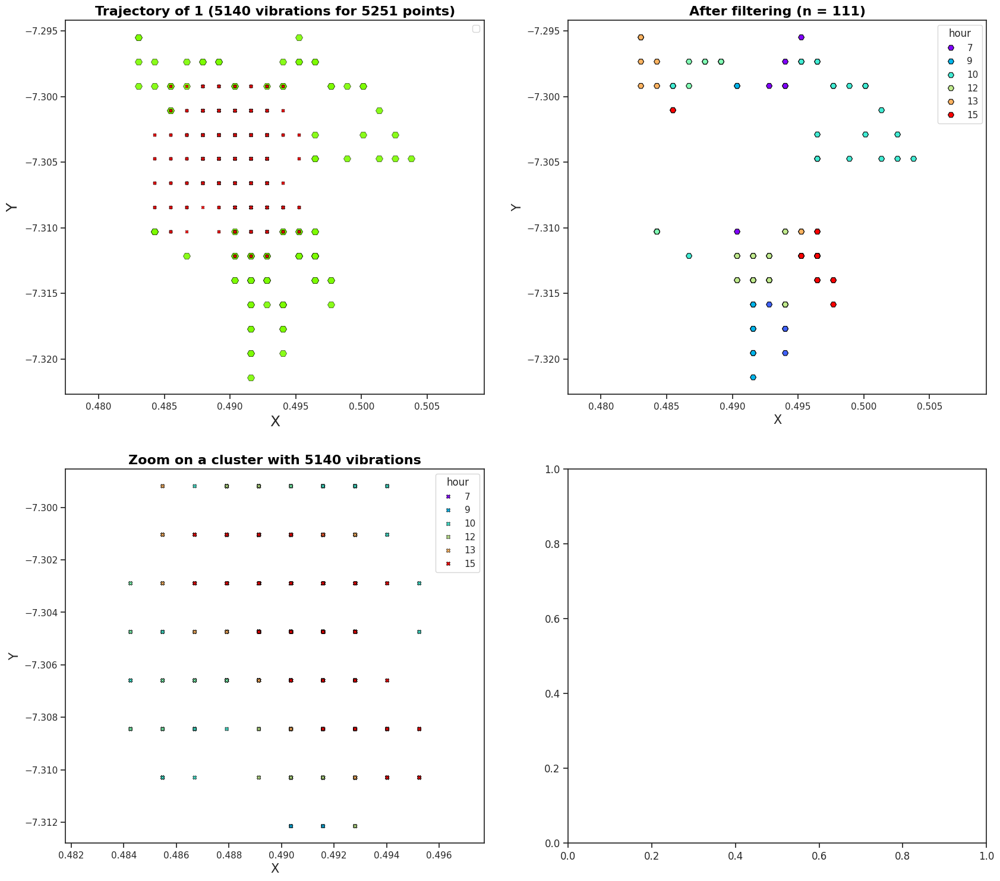

In [ ]:
plot_vib_on(data_kind_a,1,1,2,di,detect=False)

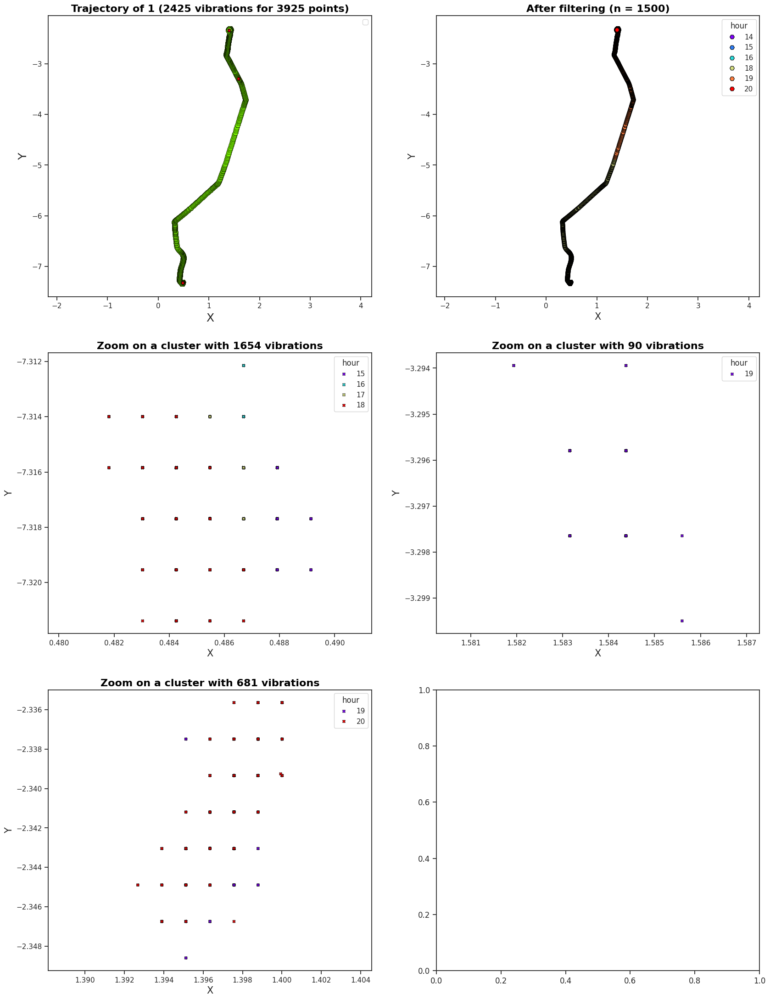

In [ ]:
plot_vib_on(data_kind_a,1,1,3,di,detect=False)

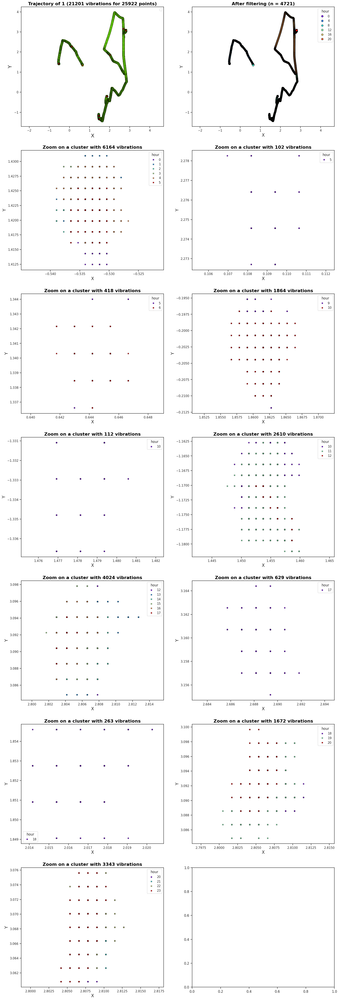

In [ ]:
plot_vib_on(data_kind_a,1,1,5,di,detect=False)

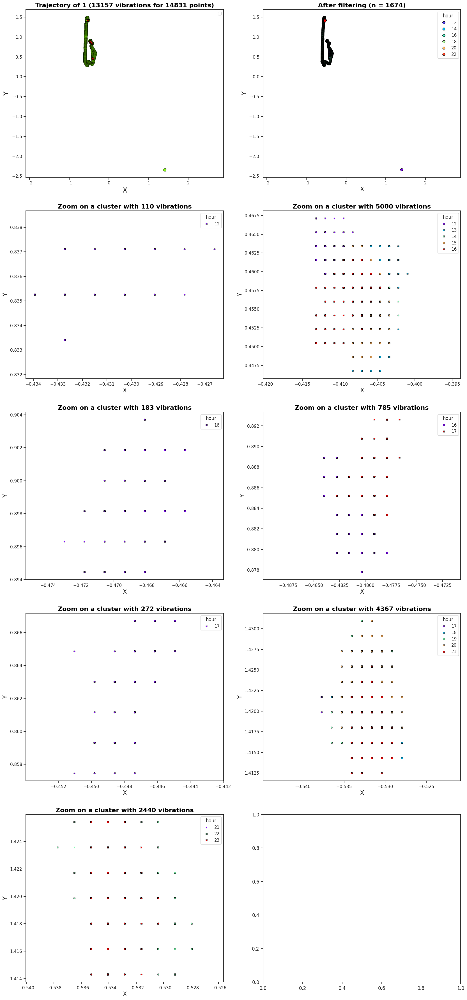

In [ ]:
plot_vib_on(data_kind_a,1,1,4,di,detect=False)

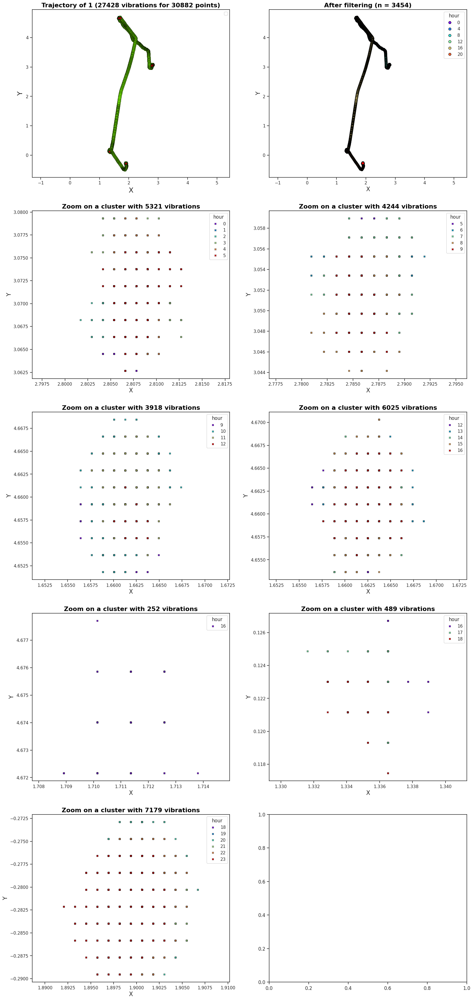

In [ ]:
plot_vib_on(data_kind_a,1,1,6,di,detect=False)

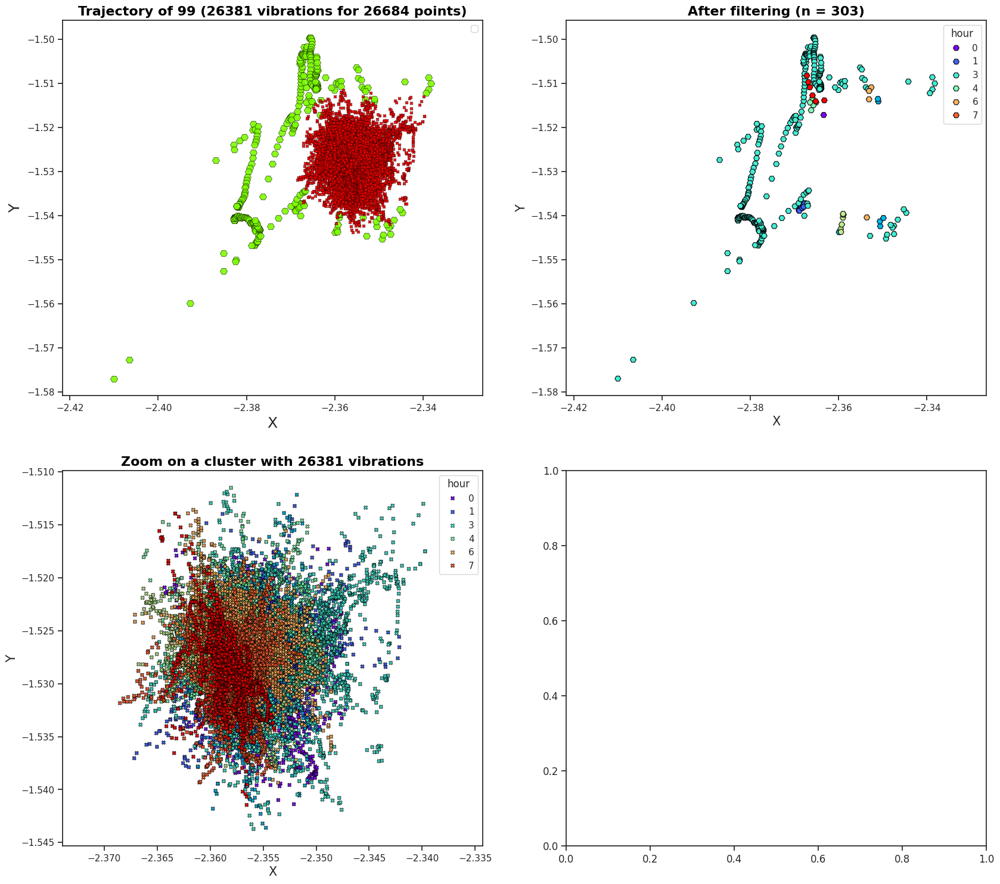

In [ ]:
plot_vib_on(data_kind_a,99,1,11,di,detect=False)

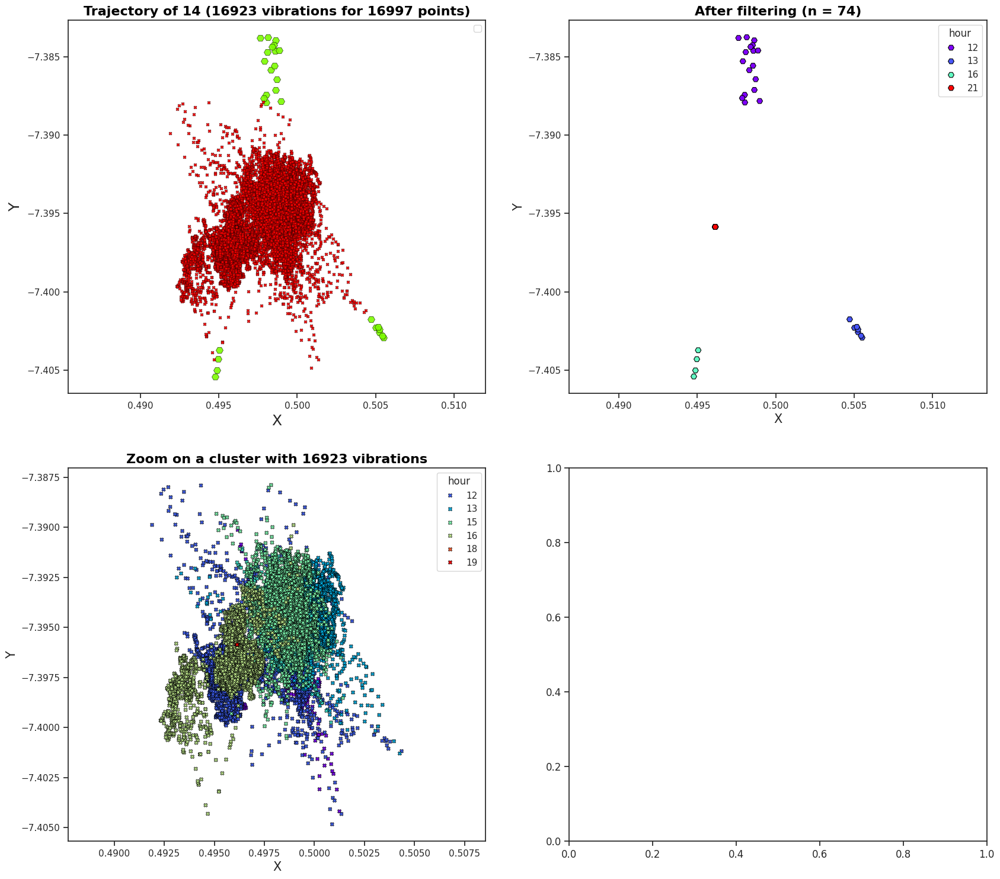

In [ ]:
plot_vib_on(data_kind_a,14,1,10,di,detect=False)

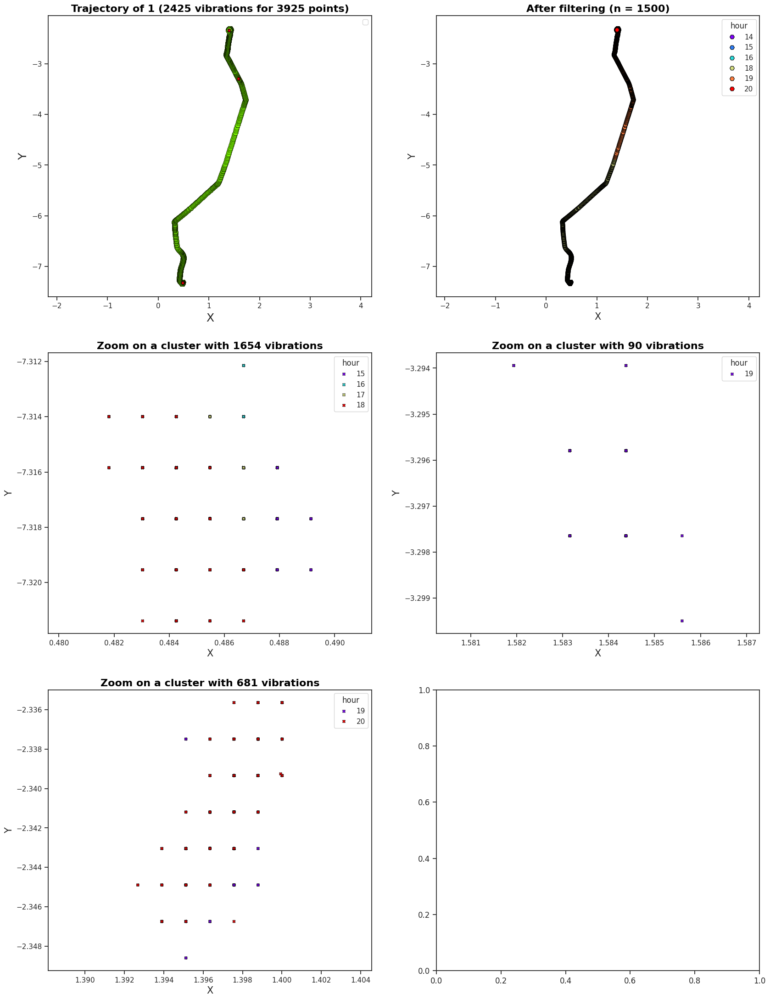

In [ ]:
plot_vib_on(data_kind_a,1,1,3,di,detect=False)

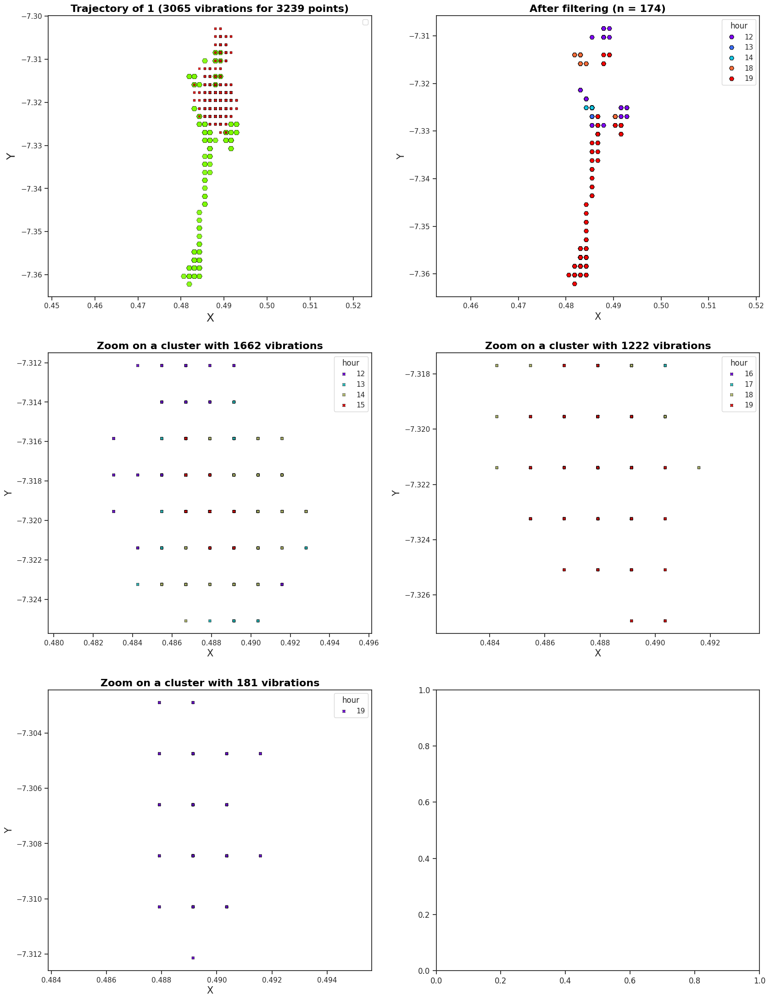

In [ ]:
plot_vib_on(data_kind_a,1,1,1,di,detect=False)

### Type D

In [ ]:
# Parameter search space for DBSCAN (can be adjusted)
eps_values = [0.015,0.02,0.025, 0.03, 0.035, 0.04]
min_samples_values = [20, 25, 30, 35, 40]
data_kind_d['ts'] = data_kind_d['Timestamp'] / 10**5 * 3

In [ ]:
# Detection of vibrations for types D
data_kind_d['vibration'] = False
data_kind_d = detect_vibrations(data_kind_d, eps_values, min_samples_values, debug=False, max_i=10)
data_kind_d['vibration'].value_counts()

Processing equipment 14
Best score: 658.6850678140814 with params (0.02, 20), 1202 vibrations detected with 2 clusters out of 1202 points
Number of points per hour: 104.43034492104032 (Best score / points per hour: 6.307410631575646)
Processing equipment 21
Best score: 131.32671168460666 with params (0.02, 20), 616 vibrations detected with 4 clusters out of 708 points
Number of points per hour: 102.67520305992035 (Best score / points per hour: 1.2790499338770778)
Processing equipment 14
Best score: 1264.6327156829843 with params (0.015, 40), 2225 vibrations detected with 7 clusters out of 3443 points
Number of points per hour: 143.54851802190086 (Best score / points per hour: 8.809792905629596)
Processing equipment 21
Best score: 134.4434352152422 with params (0.03, 25), 1600 vibrations detected with 5 clusters out of 1730 points
Number of points per hour: 72.12519683458522 (Best score / points per hour: 1.8640286767408079)
Processing equipment 14
Best score: 86.19944146805477 with par

,count
vibration,
1,14992
0,2223


In [ ]:
data_kind_d['vibration'] = data_kind_d['vibration'].astype(bool)

In [ ]:
print_ratio(data_kind_d,data_kind_d.vibration,'of GPS vibration points')

87.09% of of GPS vibration points (14992 out of 17215)


**Let's look at the results for a few trajectories**.

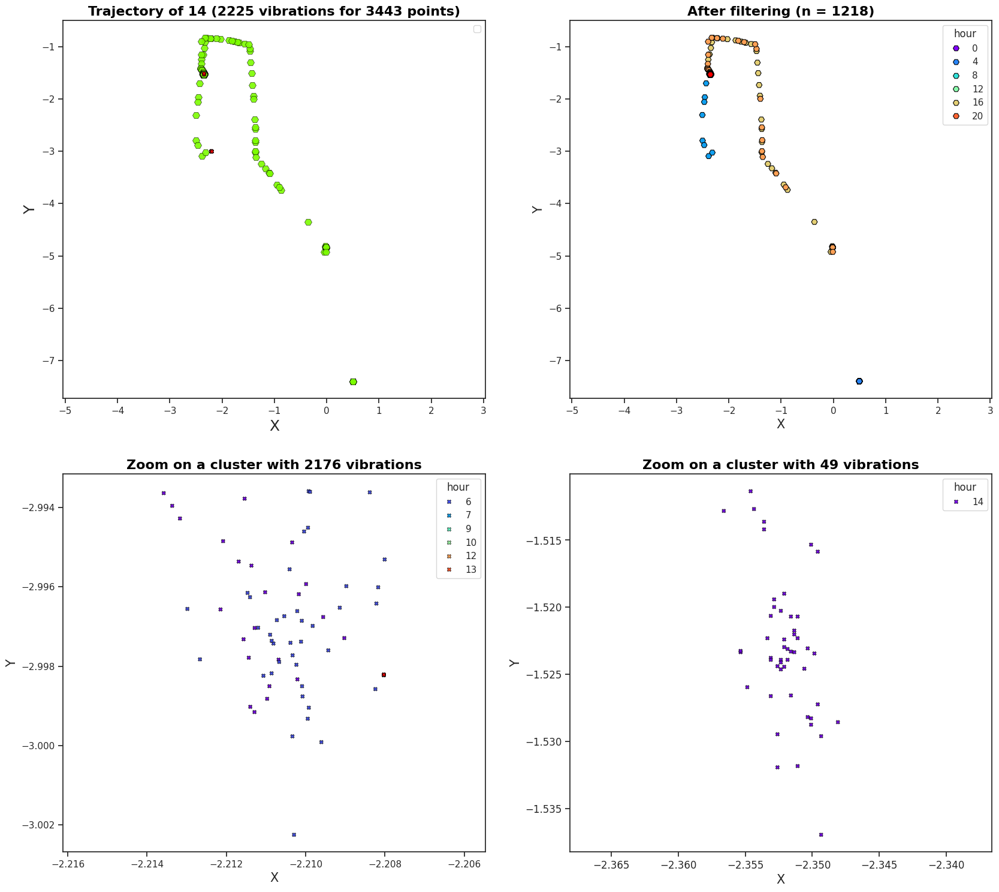

In [ ]:
plot_vib_on(data_kind_d,14,1,11,di,detect=False)

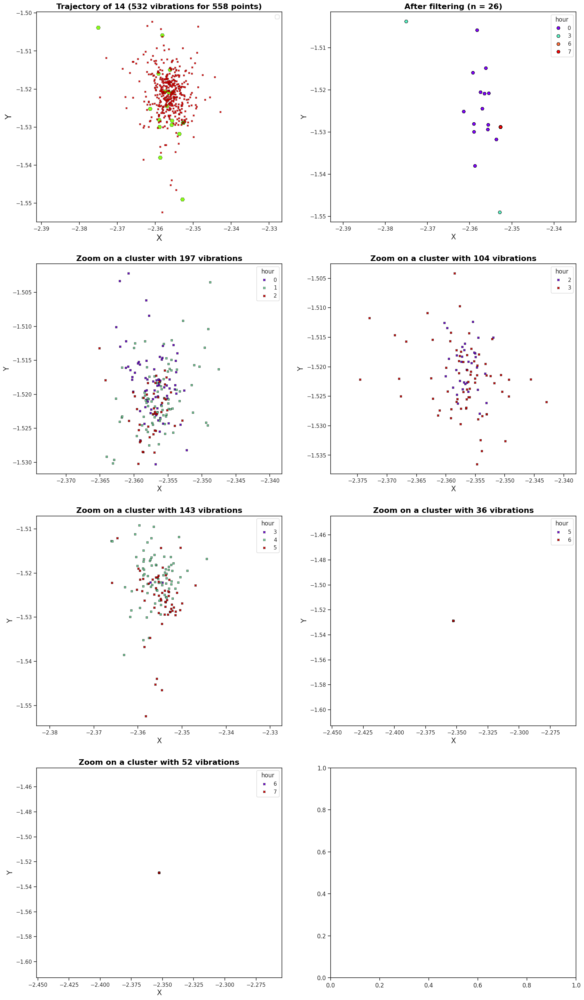

In [ ]:
plot_vib_on(data_kind_d,14,1,12,di,detect=False)

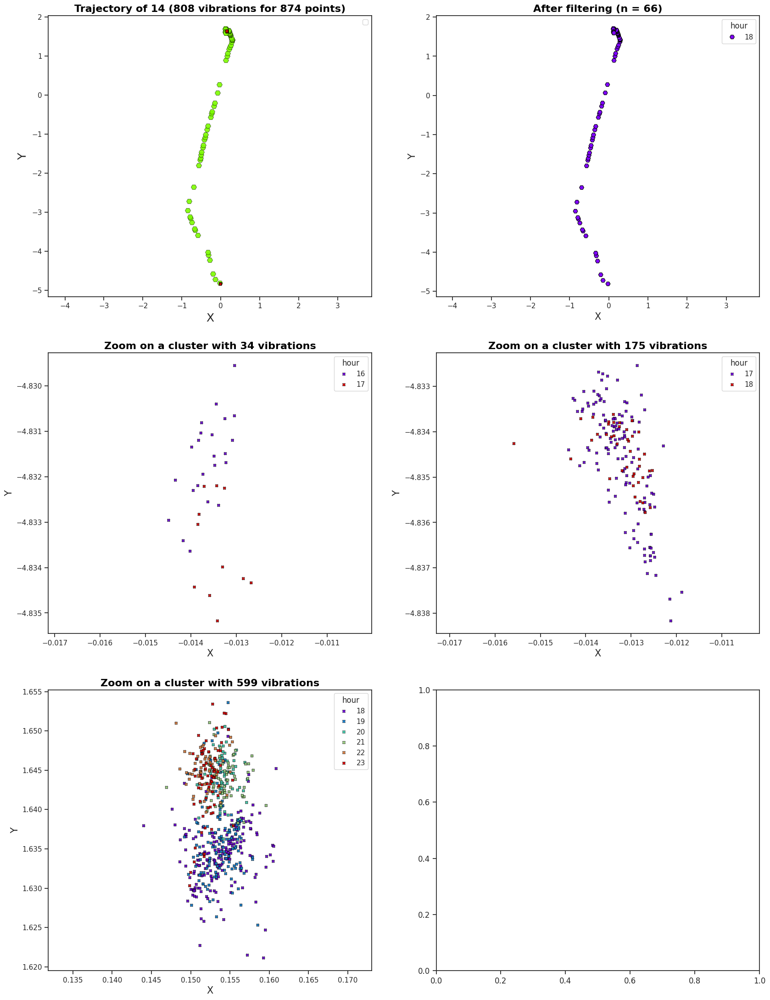

In [ ]:
plot_vib_on(data_kind_d,14,1,13,di,detect=False)

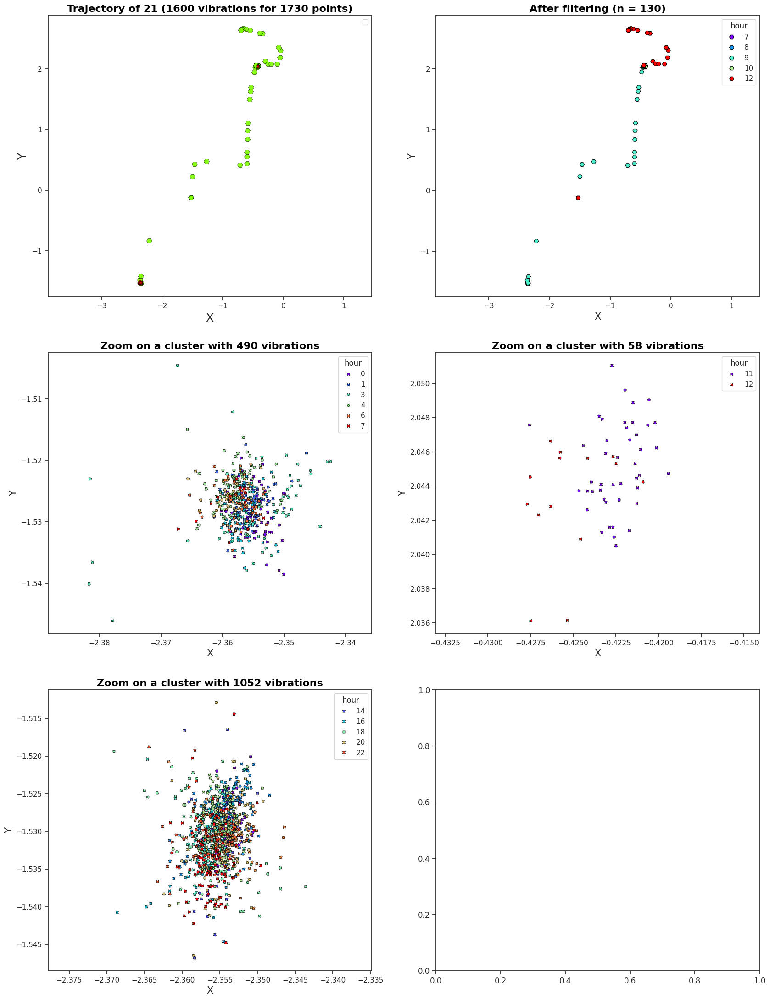

In [ ]:
plot_vib_on(data_kind_d,21,1,11,di,detect=False)

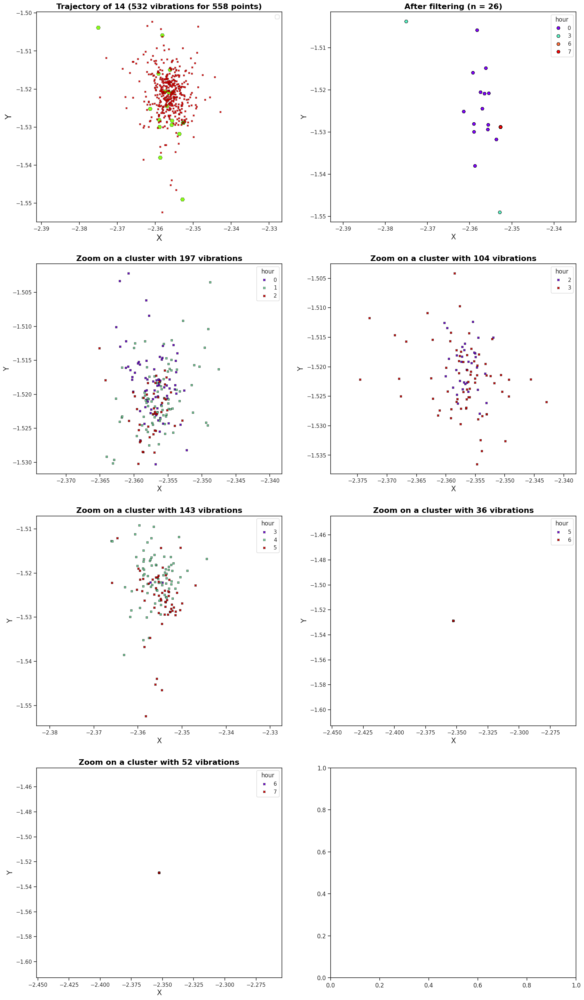

In [ ]:
plot_vib_on(data_kind_d,14,1,12,di,detect=False)

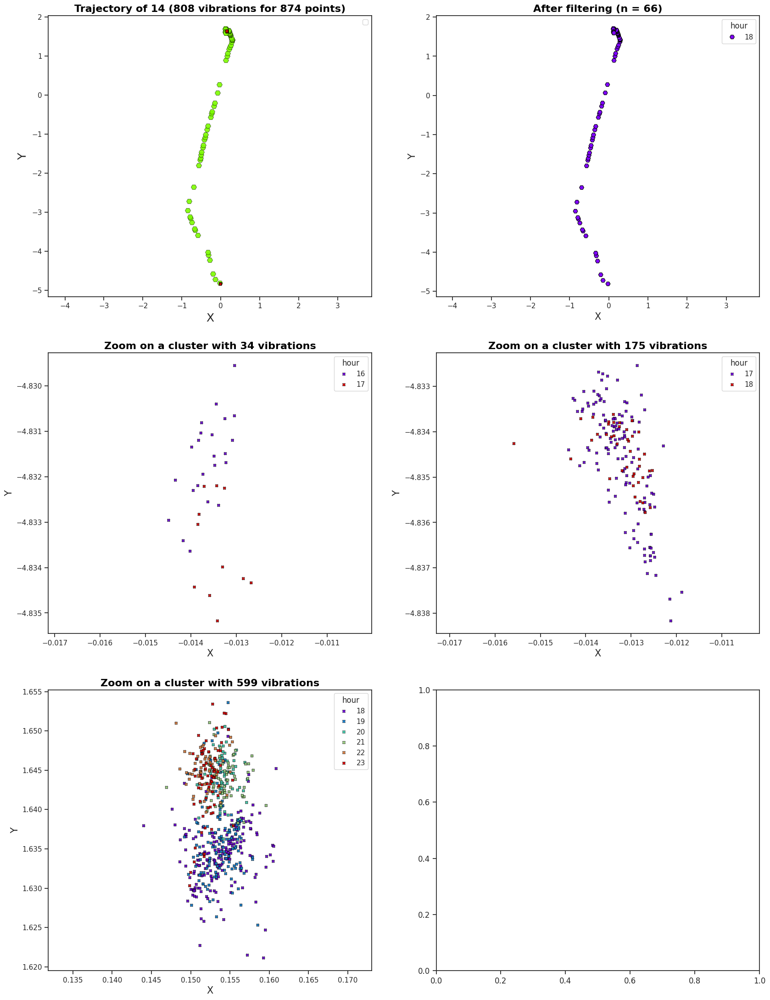

In [ ]:
plot_vib_on(data_kind_d,14,1,13,di,detect=False)

### Removal of identified vibrations and combination

In [ ]:
data = pd.concat([data_kind_a,data_kind_bc,data_kind_d])
def remove_inner_vibration_points(df):
    """
    Remove all but the first and last points of consecutive GPS vibration points for each equipment on each day.
    """

    # Function to apply for each group (each trajectory: equipment + day)
    def process_trajectory(subset):
        # Identify where the points are marked as vibration
        vibration_mask = subset['vibration']

        # Shift the mask to detect where the vibration clusters start or end
        diff = vibration_mask.diff().fillna(0).astype(bool)

        # Find the indices where vibration clusters start or end
        vibration_cluster_start_or_end = (diff | vibration_mask.shift(-1, fill_value=False) != vibration_mask)

        # Keep the first and last vibration points (True) and all non-vibration points (False)
        keep_mask = ~vibration_mask | vibration_cluster_start_or_end

        # Return only the necessary points
        return subset[keep_mask]

    # Process each equipment's trajectory (group by 'ID_equipment' and 'day')
    cleaned_df = df.groupby(['ID_equipment', 'day'], group_keys=False).apply(process_trajectory)

    return cleaned_df

data = remove_inner_vibration_points(data)

In [ ]:
data = data.sort_values(['date'])

In [ ]:
# Comparing size with a dataset that doesn't have first and last points of vibration clusters
test = pd.concat([data_kind_a, data_kind_bc,data_kind_d])
print_ratio2(test,data,"points remain after removing inner vibration points")

15.87% of points remain after removing inner vibration points (449970 out of 2835545)


## Handling outliers

### Computation of distances to centroid for each trajectory

We are going to filter statistical outliers based on the difference between the average distance to the centroid and each point's distance to the centroid. Hence, points that are anormaly far from the centroid will be considered outliers.

In [ ]:
data['classif'] = 1
data['dist_centroid'] = 0

In [ ]:
gb = data.groupby(["ID_equipment",'day'])[['x','y']]
dist_centroid = gb.transform(lambda x: (x - x.mean())**2).sum(1)
data['dist_centroid'] = np.sqrt(dist_centroid)
data['dist_centroid'][:3]

,dist_centroid
13,1.38011
14,1.38011
33,0.00232


In [ ]:
data['centroid_mean'] = 0
data['centroid_mean'] = data.centroid_mean.astype('float')
gb = data.groupby(['day',"ID_equipment"])
data['centroid_mean'] = gb.dist_centroid.transform('mean')
data[['date','ID_equipment','centroid_mean']].head()

,date,ID_equipment,centroid_mean
13,2024-01-01 12:35:30.210,8,0.98389
14,2024-01-01 12:35:30.770,8,0.98389
33,2024-01-01 12:35:43.615,12,0.00639
49,2024-01-01 12:35:54.112,8,0.98389
51,2024-01-01 12:35:54.771,8,0.98389


### Selection of a threshold and deletion of outliers

In [ ]:
def elbow_plot(n=None):
    fig, ax = plt.subplots(figsize=(4,4))
    x = mean_factors if n is None else mean_factors[:n]
    y = outlier_ratios if n is None else outlier_ratios[:n]
    sns.lineplot(x=x,y=y,ax=ax)
    ax.set_xlabel('Outlier Threshold Multiplier')
    ax.set_ylabel("Proportion of outliers")
    plt.show()

def test_multiple_factors(data):
    global mean_factors, outlier_numbers, outlier_ratios, classifs
    mean_factors = []
    outlier_numbers = []
    outlier_ratios = []
    classifs = {}
    for i in range(2,11):
        data.classif = 1
        data.loc[data.classif == 1, 'classif'] = data.loc[data.classif == 1].apply(lambda x: -2 if x['dist_centroid'] > i * x['centroid_mean'] else 1,axis=1)
        outlier = data.classif == -2
        outlier_number = data[outlier].shape[0]
        outlier_ratio = outlier_number / data.shape[0]
        outlier_numbers.append(outlier_number)
        outlier_ratios.append(outlier_ratio)
        mean_factors.append(i)
        classifs[str(i)] = data.classif.copy()
        #print(f"{i} : {outlier_ratio}")

In [ ]:
def find_outliers(data,factor):
    data['classif'] = data.apply(lambda x: -2 if x['dist_centroid'] > factor * x['centroid_mean'] else 1,axis=1)
    outlier = data.classif == -2
    outlier_number = data[outlier].shape[0]
    outlier_ratio = outlier_number / data.shape[0]
    print(f"{outlier_number} outliers have been found: {round(outlier_ratio*100,3)}% of the dataset")
    return data

In [ ]:
is_type_A = data.kind == "A"
data_kind_a2 = data[is_type_A]

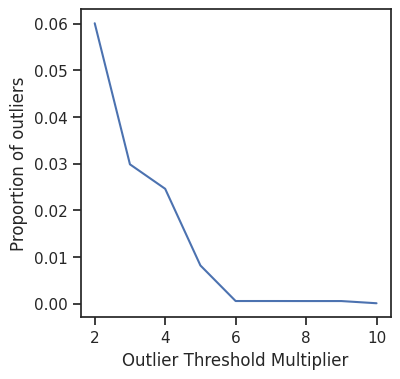

In [ ]:
test_multiple_factors(data_kind_a2)
elbow_plot()

The optimal threshold multiplier seems to be at 5 or 6, because that's where the rate of decrease in the proportion of outliers starts to level off. The rate is almost constant after 6. I have hence chosen 6 to make sure I don't remove any valid point because, after separate experimentation on filtered trajectories, 5 still classified valid, coherent points as outliers.

In [ ]:
data_kind_a2 = find_outliers(data_kind_a2,6)
data_kind_a2 = data_kind_a2[data_kind_a2.classif == 1]

82 outliers have been found: 0.057% of the dataset


In [ ]:
other = data[~is_type_A]

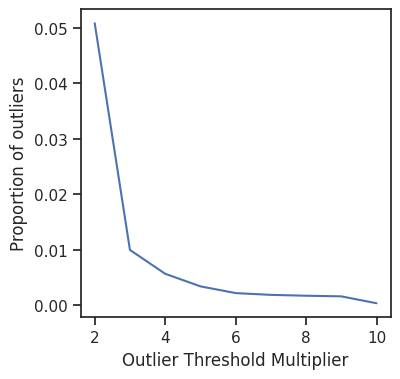

In [ ]:
test_multiple_factors(other)
elbow_plot()

Here the optimal threshold according to the elbow plot is 3. To be safe once again and avoid flagging legitimate points as anomalies (GPS errors), I have chosen 4.

In [ ]:
other = find_outliers(other,4)
other = other[other.classif == 1]
del is_type_A

1737 outliers have been found: 0.569% of the dataset


### Combination

In [ ]:
print_nrows(data)
data = pd.concat([data_kind_a2,other])
print("Removed outliers")
print_nrows(data)
data = data.sort_values('date')
data.head()

Number of lines :  449970
Removed outliers
Number of lines :  448151


,date,kind,ID_origin,ID_equipment,x,y,hour,day,Timestamp,vibration,label,ts,classif,dist_centroid,centroid_mean
13,2024-01-01 12:35:30.210,B1,0,8,-1.28536,3.91623,12,2024-01-01,10.085,False,-1,0.00030,1,1.38011,0.98389
14,2024-01-01 12:35:30.770,C,0,8,-1.28536,3.91623,12,2024-01-01,10.645,False,-1,0.00032,1,1.38011,0.98389
33,2024-01-01 12:35:43.615,B1,0,12,0.48785,-7.32587,12,2024-01-01,23.490,False,-1,0.00070,1,0.00232,0.00639
49,2024-01-01 12:35:54.112,B1,0,8,-1.29793,4.03056,12,2024-01-01,33.987,False,-1,0.00102,1,1.47313,0.98389
51,2024-01-01 12:35:54.771,C,0,8,-1.29793,4.03056,12,2024-01-01,34.646,False,-1,0.00104,1,1.47313,0.98389


# Selection of interesting and usable trajectories

## Removal of trajectoires covering too small an area

For each trajectory, which represents all points related to an equipment at a specific date, we want to check if it is interesting enough and shows sufficient movement. Indeed, we don't want to keep inactive days in our dataset. To do this, we calculate the area of its bounding box and consider it irrelevant if it is under a threshold determined during experimentation.

In [ ]:
def calculate_bounding_box_area(data):
    ymin, ymax, xmin, xmax = data.x.min(), data.x.max(), data.y.min(), data.y.max()
    distx = (xmax - xmin)
    disty = (ymax - ymin)
    return distx * disty

In [ ]:
min_area = 0.7
initial_nrows = data.shape[0]
data = data.groupby(['day',"ID_equipment"]).filter(lambda x: calculate_bounding_box_area(x) > min_area)
print_ratio3(initial_nrows, initial_nrows - data.shape[0], 'points removed due to belonging to uninteresting trajectories')

2.63% of points removed due to belonging to uninteresting trajectories (11769 out of 448151)


## Processing types separately based on their specificities

In [ ]:
data2_kind_a = data[data.kind == "A"]
data2_kind_bc = data[data.kind.isin(["B1","B2","C"])]
data2_kind_d = data[data.kind.isin(["D1","D2"])]

### Filtering types B and C for equipments which already have types A

In [ ]:
sections_with_kind_a = data2_kind_a.ID_equipment.unique().tolist()
is_kind_a_section = data2_kind_bc.ID_equipment.isin(sections_with_kind_a)
print_ratio(data2_kind_bc,is_kind_a_section,'of points of kind B and C removed because of belonging to equipment already covered by type A')
data2_kind_bc = data2_kind_bc[~is_kind_a_section]
print("Sections covered by type A: ", sections_with_kind_a)
del is_kind_a_section

0.89% of of points of kind B and C removed because of belonging to equipment already covered by type A (2628 out of 295577)
Sections covered by type A:  [38, 1, 99, 21, 14]


### Reduction of the number of types A

Points of type A seem to have been registered extremely frequently,  to the point where we can remove a lot of them without losing any information on the trajectory of the equipments. Plots comparing a few trajectories before and after this process are at the end of this process

#### Preparation

In [ ]:
diff = data2_kind_a.groupby(['day','ID_equipment'])[['x','y']].transform('diff')
diff[["x","y"]] = diff[["x","y"]].fillna(0)
data2_kind_a["dist"] = np.sqrt(diff['y'] ** 2 + diff['x'] ** 2)
data2_kind_a['time'] = pd.to_timedelta(data2_kind_a['date'].dt.time.astype(str))
temp = data2_kind_a.groupby([data2_kind_a.day,'ID_equipment'])[['time']].transform('diff')
data2_kind_a.drop(["time"],axis=1,inplace=True)
data2_kind_a["time_diff"] = temp["time"]
data2_kind_a["time_diff"] = data2_kind_a["time_diff"].dt.total_seconds().fillna(1000)

### Computation of thresholds for point deletion (parameters determined during exploration)

In [ ]:
data2_kind_a['classif'] = 1 #1: to keep | 2 : to delete
time_diff_max_for_removal = data2_kind_a.time_diff.quantile(q=0.93)
dist_max_for_removal = data2_kind_a.dist.quantile(q=0.9998)
max_consecutive_points_to_remove = 6
time_diff_max_for_removal, dist_max_for_removal.round(7)

(1.999, 0.0591282)

### Identification of points to be removed

In [ ]:
consecutive_points_removed = max_consecutive_points_to_remove
def limit_data_kind_a(time_diff,dist):
    global last_point_removed, consecutive_points_removed
    if (time_diff < time_diff_max_for_removal) & (dist < dist_max_for_removal) & (consecutive_points_removed < max_consecutive_points_to_remove):
        consecutive_points_removed += 1
        return 2
    else:
        consecutive_points_removed = 0
        return 1

In [ ]:
for ID_equipment in data2_kind_a.ID_equipment.unique():
    global consecutive_points_removed
    consecutive_points_removed = max_consecutive_points_to_remove
    ID_equipment_cond = (data2_kind_a.ID_equipment == ID_equipment)
    data2_kind_a.loc[ID_equipment_cond,"classif"] = data2_kind_a.loc[ID_equipment_cond].apply(lambda x: limit_data_kind_a(x["time_diff"],x["dist"]),axis=1)
    #data2_kind_a["classif"] = data2_kind_a.apply(lambda x: data2_kind_a(x["time_diff"],x["dist"]),axis=1)

Ratio lignes à enlever / lignes à garder

In [ ]:
print_ratio(data2_kind_a,data2_kind_a.classif == 2,'of points of type A judged redundant to remove')

81.86% of of points of type A judged redundant to remove (113922 out of 139170)


## Visualisation of the full trajectories compared to the trajectories without the points judged redundant

In [ ]:
di = DATAINFO(data2_kind_a,0,0,reference_timestamp,id_col='ID_equipment',anonyme=True, year=2024)

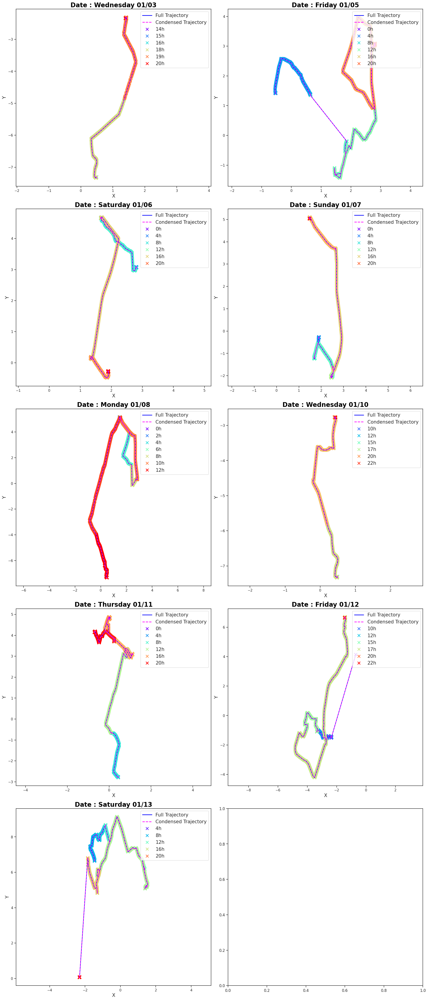

In [ ]:
pl.study_equipment(1,di,scatter=False,show_filtered=True)

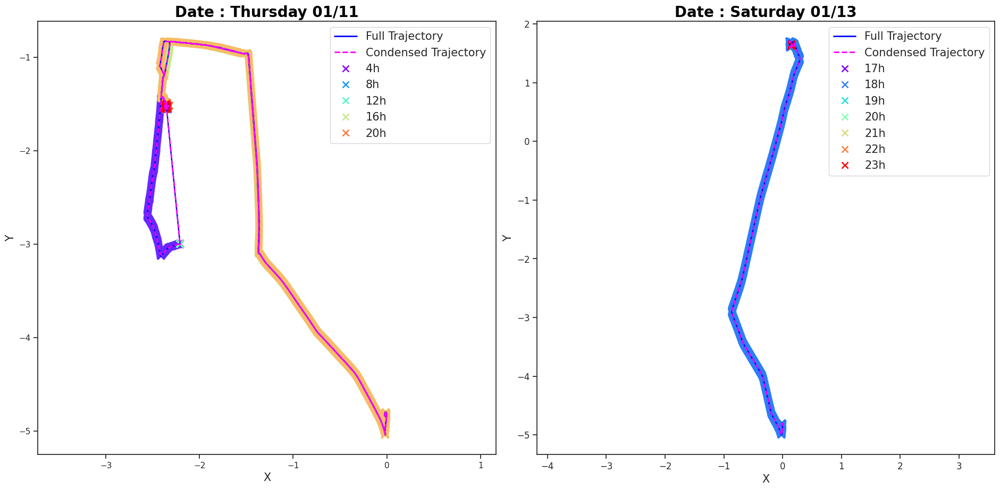

In [ ]:
pl.study_equipment(14,di,scatter=False,show_filtered=True)

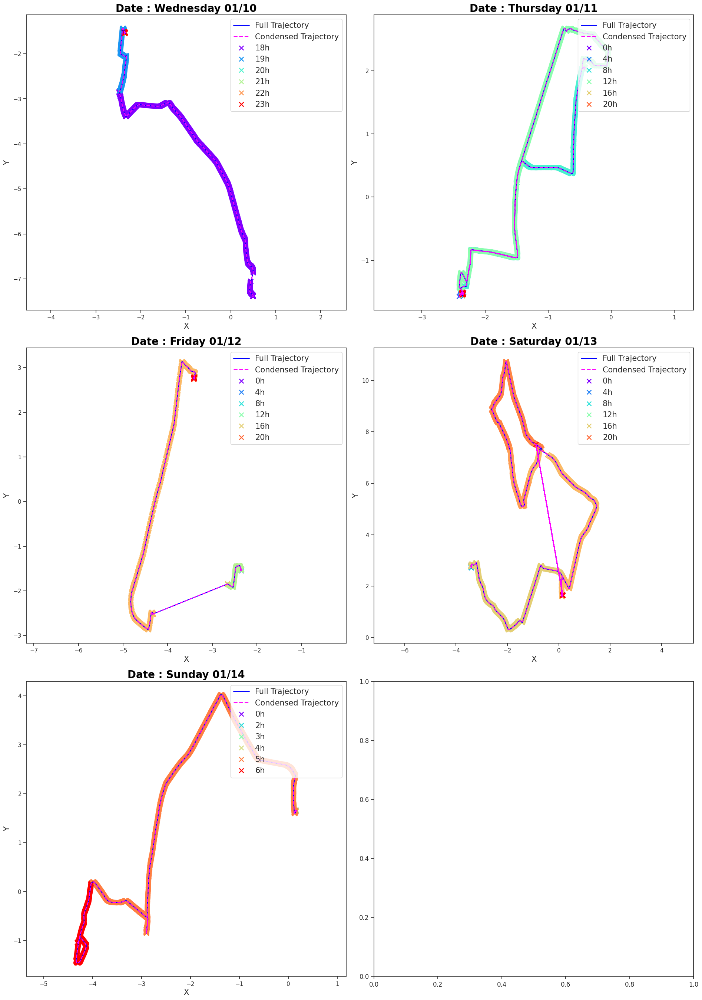

In [ ]:
pl.study_equipment(21,di,scatter=False,show_filtered=True)

# Finalization

Let's drop columns that were only added for specific processes

In [ ]:
data.drop(['dist_centroid','centroid_mean','classif','vibration','ts','day'], axis=1,inplace=True)

We can check the size of the reduced and processed dataframe

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 436382 entries, 13 to 2171861
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          436382 non-null  datetime64[ns]
 1   kind          436382 non-null  object        
 2   ID_origin     436382 non-null  int32         
 3   ID_equipment  436382 non-null  int32         
 4   x             436382 non-null  float64       
 5   y             436382 non-null  float64       
 6   hour          436382 non-null  int64         
 7   Timestamp     436382 non-null  float64       
 8   label         436382 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int32(2), int64(2), object(1)
memory usage: 30.0+ MB


### Saving the processed dataset

In [ ]:
data.to_csv('movement_data_after_processing.csv', index=False)

In [ ]:
test = pd.read_csv('movement_data_after_processing.csv',parse_dates=['date'], dtype={
    "ID_origin": "int32", "ID_equipment": "int32", "x": float, "y": float,
    "velocity": float, "kind": str,
    "hour": "int16", "Timestamp": "float64"

})
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 436382 entries, 0 to 436381
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          436382 non-null  datetime64[ns]
 1   kind          436382 non-null  object        
 2   ID_origin     436382 non-null  int32         
 3   ID_equipment  436382 non-null  int32         
 4   x             436382 non-null  float64       
 5   y             436382 non-null  float64       
 6   hour          436382 non-null  int16         
 7   Timestamp     436382 non-null  float64       
 8   label         436382 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int16(1), int32(2), int64(1), object(1)
memory usage: 24.1+ MB


In [ ]:
del test, data